## Clustering and annotating cells of NR myeloid atlas

* This analysis uses the object 'NRdata_to-cluster.h5ad' generated in the notebook 2024-09-10_Nikita-Python-Integration-Final.jpynb

* In this notebook will perform sequential clustering and annotating of clusters until all cells annotated

* To do this perform initial clustering, label DCs vs monocytes vs macs, and then take out eg. DCs (split object) and repeat from finding hvgs onwards to re-cluster

In [1]:
#load packages I need
import os
import tools
import scanpy as sc
import pandas as pd
import dandelion as ddl
from tqdm import tqdm
import matplotlib.pyplot as plt
import scanpy.external as sce

In [2]:
#show current directory 
os.getcwd()
os.chdir('/scratch/user/s4436039/scdata/Python_Integration_Sep')
os.getcwd()

'/scratch/user/s4436039/scdata/Python_Integration_Sep'

Print software versions:

In [3]:
sc.logging.print_header()

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.26.4 scipy==1.14.0 pandas==2.2.2 scikit-learn==1.5.0 statsmodels==0.14.2 igraph==0.11.5 pynndescent==0.5.12


In [4]:
ddl.logging.print_header()

dandelion==0.3.8 pandas==2.2.2 numpy==1.26.4 matplotlib==3.9.2 networkx==3.3 scipy==1.14.0


Set plotting parameters

In [5]:
sc.settings.set_figure_params(dpi=80, facecolor="white")

In [6]:
#read in the file
data = sc.read_h5ad('/scratch/user/s4436039/scdata/Python_Integration_Sep/NRdata_to-cluster.h5ad')

### Perform initial clustering (~20min):

In [7]:
sc.tl.leiden(data, resolution=0.2)

/scratch/temp/10833922/ipykernel_2948498/766553368.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


### Visualising clusters:

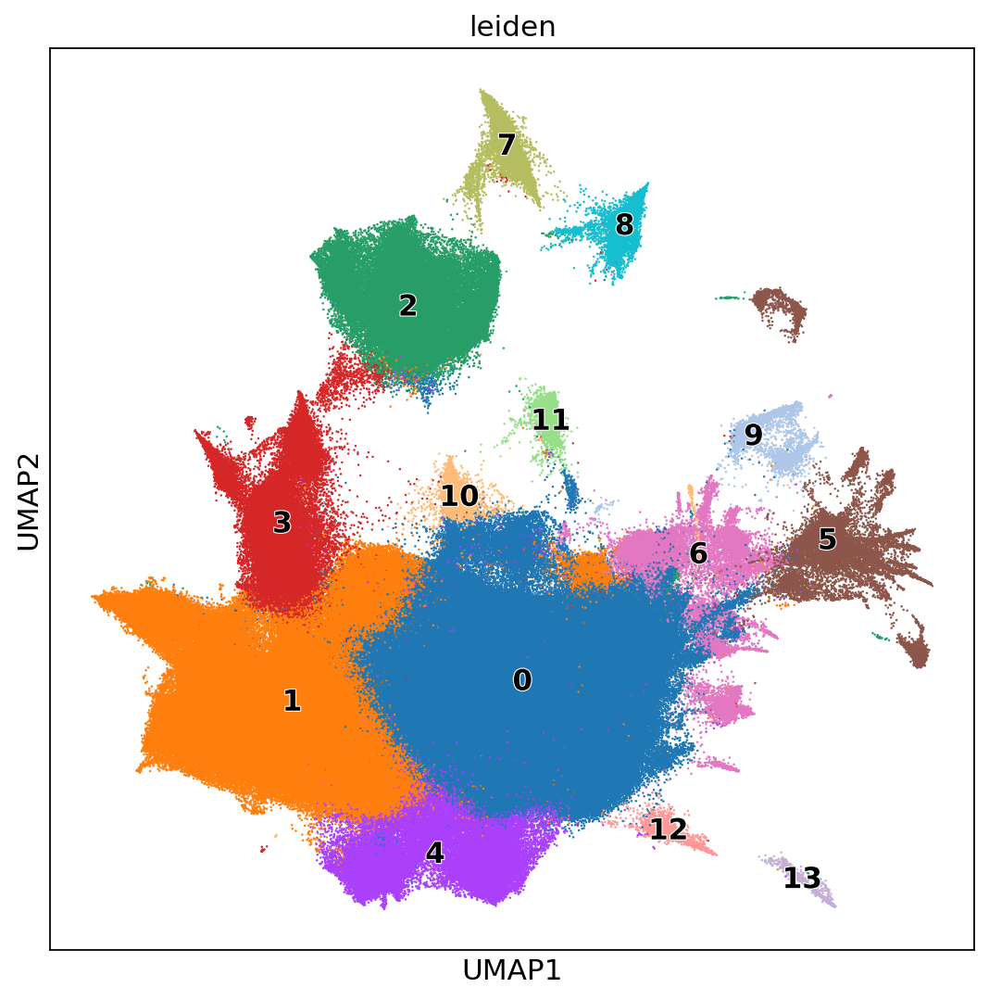

In [8]:
#plotting clusters
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data, color="leiden", legend_loc="on data", legend_fontoutline=1, size=5)

In [14]:
broad_marker_genes = {
    "DC": ["HLA-DRA"],
    "cDC1": ["CLEC9A", "XCR1","BATF3","IRF8"],
    "cDC2": ["CD1C", "FCER1A", "CLEC10A","CD5","IRF4"],
    "DC3": ["CD1C","FCER1A","CD14","CD163"],
    "mregDC": ["LAMP3","CD274","CCR7"],
    "pDC": ["IL3RA", "CLEC4C","IRF7"],
    "Monocytes": ["CD14", "FCGR3A", "LYZ","S100A8","S100A9","CCR2"],
    "Macrophages": ["FCGR1A", "CD68","CSF1R"],
    "NK": ["NCAM1","KLRD1","NKG7","GZMB"],
    "T cells": ["CD3G", "CD8A", "CD4"],
    "B cells": ["CD19", "MS4A1"],
    "Proliferating": ["MKI67"]
}

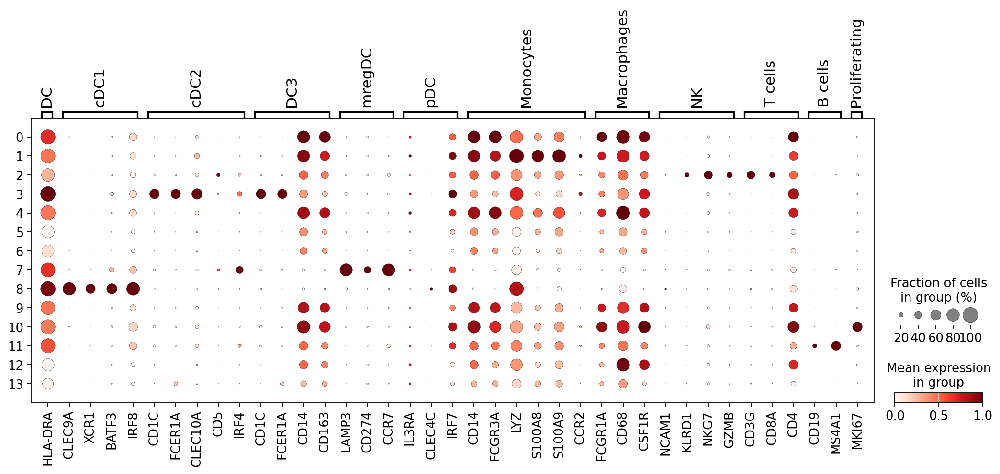

In [15]:
sc.pl.dotplot(data, broad_marker_genes, groupby="leiden", standard_scale="var")

#### Notes from dot plot above
* cluster 0 --> mono/mac
* cluster 1 --> mono?
* cluster 2 --> contaminants? NK cells/T cells
* cluster 3 --> cDC2
* cluster 4 --> macs
* cluster 5 --> contaminants?
* cluster 6 --> contaminants?
* cluster 7 --> mregDC
* cluster 8 --> cDC1 
* cluster 9 --> mac/mono
* cluster 10 --> mac/mono, KI67+?
* cluster 11 --> contaminants? B cells
* cluster 12 --> CD68+ DR-
* cluster 13 --> ??

In [16]:
broad_markers = ["HLA-DRA", "CLEC9A", "XCR1","BATF3","IRF8", "CD1C", "FCER1A", "CLEC10A","CD5","IRF4", "CD1C","FCER1A","CD14","CD163", "LAMP3","CD274","CCR7", "IL3RA", "CLEC4C","IRF7", "CD14", "FCGR3A", "LYZ","S100A8","S100A9","CCR2", "FCGR1A", "CD68","CSF1R", "NCAM1","KLRD1","NKG7","GZMB", "CD3G", "CD8A", "CD4", "CD19", "MS4A1","MKI67"]

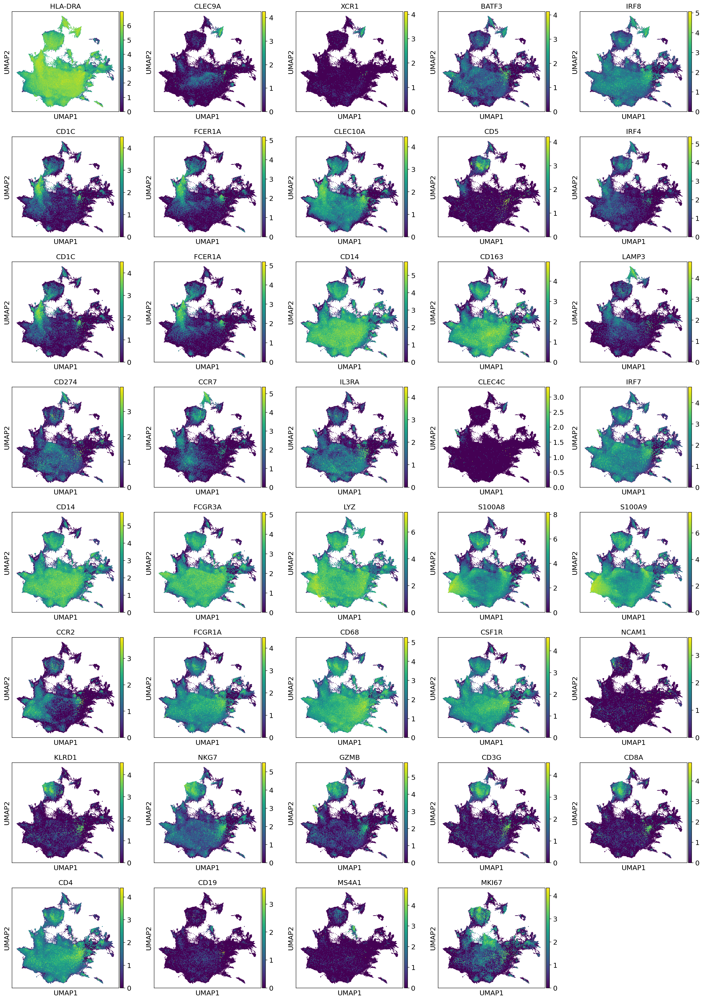

In [17]:
#plot DC/mono/mac marker genes on UMAP 
sc.pl.umap(
    data,
    color=broad_markers,
    ncols=5,
    size=5,
)


In [18]:
#find DEG genes for each cluster: scanpy tute
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(data, groupby="leiden", method="wilcoxon")

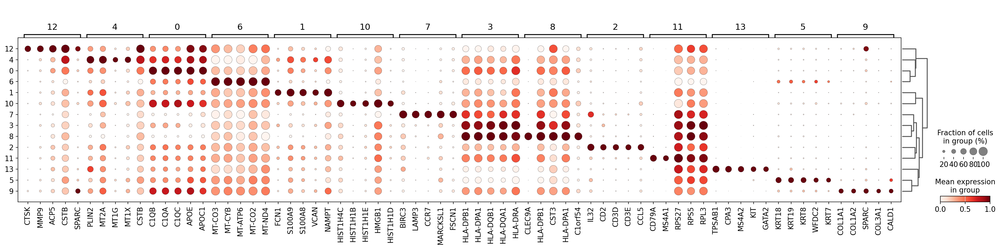

In [21]:
#visualise the top 5 DEG genes for each cluster
sc.pl.rank_genes_groups_dotplot(
    data, groupby="leiden", standard_scale="var", n_genes=5
)

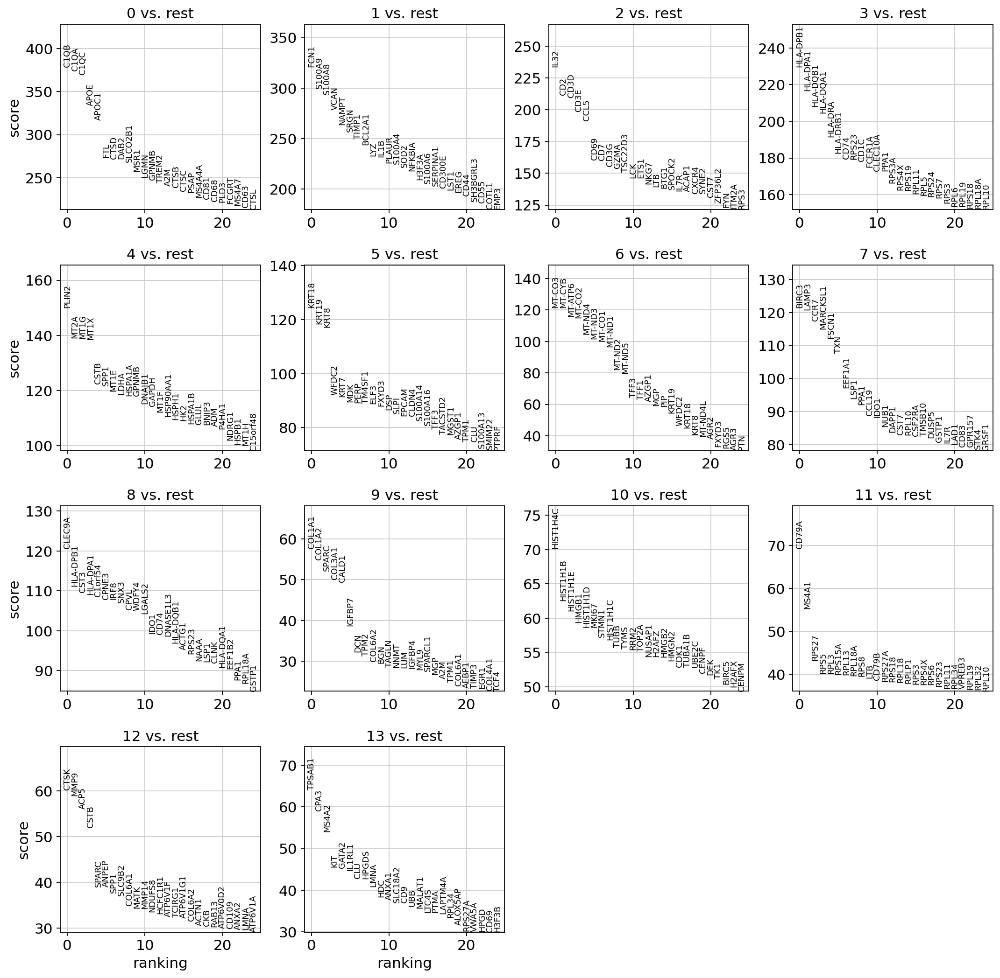

In [23]:
sc.pl.rank_genes_groups(data, n_genes=25, sharey=False)  # sharey means each panel

categories: 0, 1, 2, etc.
var_group_labels: 1, 2, 3, etc.


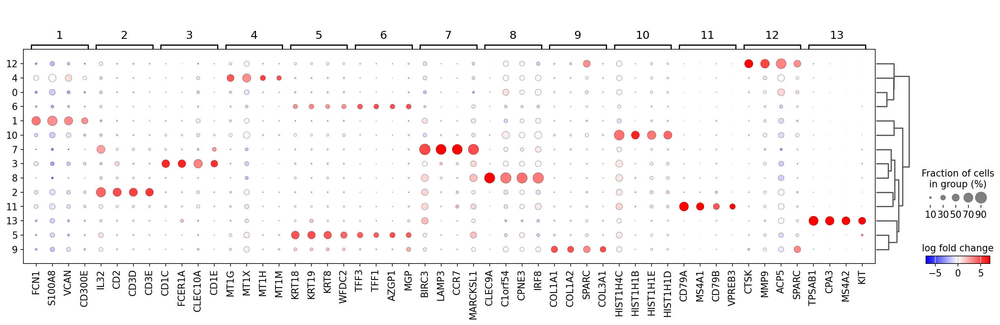

In [24]:
sc.pl.rank_genes_groups_dotplot(
    data,
    n_genes=4,
    values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="bwr",
)

In [25]:
data.write_h5ad("NR-cluster-v1.h5ad", compression="gzip")

In [ ]:
# subset DC/macs/mono from object
adata_subset = adata[adata.obs['louvain'].isin(['2', '3'])]

### subset out eg. DCs and then repeat from hvg to subcluster them?? So redo regression? or just pca, neighbours, umap?

In [ ]:
data.write_h5ad("data_i_int4.h5ad", compression="gzip")